In [1]:
# pip install gensim

In [2]:
# pip install spacy

In [3]:
# pip install pyLDAvis

In [4]:
# pip install C:/Users/USER/AppData/Roaming/jupyterlab-desktop/jlab_server/Lib/site-packages/en_core_web_sm-3.0.0.tar.gz

In [1]:
import nltk
nltk.download("stopwords")
import numpy as np
import json
import glob
import gensim
import gensim.corpora as corpora

#gensim
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# #spacy
# import spacy

from nltk.corpus import stopwords



#vis
import pyLDAvis
import pyLDAvis.gensim_models

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
C:\Users\USER\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\past\builtins\misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


In [2]:
import spacy
# !python -m spacy download en_core_web_sm 

In [3]:
spacy.load('en_core_web_sm')

In [5]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
import pandas as pd
import string
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from os.path import dirname, abspath
from pathlib import Path
import os

In [6]:
folder_path= 'C:/Users/USER/Desktop/for_corpus/'

In [7]:
filenames = os.listdir('C:/Users/USER/Desktop/Files')

In [8]:
os.chdir('C:/Users/USER/Desktop/Files/')

In [9]:
pd.set_option('display.max_colwidth', 100)
stopwords = nltk.corpus.stopwords.words('english')

In [10]:
def clean_text(text):
    text = text.replace("\n","")
    text = "".join([word.lower() for word in text if word not in string.punctuation])
    sent = " ".join(w for w in nltk.wordpunct_tokenize(text) \ if w.lower()in wods or not w.isalpha())
    no_numbers = ''.join(c for c in sent if not c.isdigit())
    tokens = re.split('\W+', no_numbers)
    text = [word for word in tokens if word not in stopwords]
    return text

In [12]:
# Creating text files for each document
for item in filenames:
    inside_file = open(item, 'r', encoding= "utf-8")
    
    # file = open(inside_file[x], "r", encoding= "utf-8")
    
    text = inside_file.read()
    text = text.replace("\\n"," ")
    # text = text.replace("•",",")
    tokenizer = nltk.data.load("tokenizers/punkt/english.pickle") # LOAD TOKENIZER
    sentences = sent_tokenize(text)
    
    sentences = pd.DataFrame(sentences)
    
    p = Path(folder_path).joinpath(f"{item}.txt")
    if not p.is_file():
        sentences.to_csv(p,index=False)
    else:
        print('file exists')

In [13]:
from nltk.corpus.reader.plaintext import PlaintextCorpusReader

In [26]:
corpus = PlaintextCorpusReader(folder_path, '.*.txt')

In [27]:
corpus_sent = []
for fileid in corpus.fileids():
    filename = fileid.split('/')
    corpus_sent.append((filename, corpus.raw(fileid)))

In [28]:
df_corpus = pd.DataFrame(corpus_sent, columns=['filename', 'text'])

In [29]:
df_corpus.head()

,filename,text
0,[AUSTRIA.pdf.txt.txt],"""Artificial Intelligence Mission Austria 2030 AIM AT 2030 Artificial Intelligence Mission Aus..."
1,[BELGIUM.pdf.txt.txt],"AI-4Belgium Everyone wants to get ahead.\r\n""You do, your neighbour does and so do we.""\r\nThe..."
2,[BULGARIA.pdf.txt.txt],"REPUBLIC OF BULGARIA MINISTRY OF TRANSPORT, INFORMATION TECHNOLY AND COMMUNICATIONS ..."
3,[CZECH.pdf.txt.txt],National Artificial Intelligence Strategy of the Czech Republic Acknowledgement The Nationa...
4,[DENMARK.pdf.txt.txt],National Strategy for Artificial Intelligence N ational Strategy for A rtifi cial Intelligenc...


In [22]:
# print(df_corpus['text'][4][70:90])

al Strategy for Arti


In [30]:
corpus_text = df_corpus['text']

In [31]:
print(corpus_text)

0     "Artificial Intelligence Mission Austria 2030   AIM AT 2030  Artificial Intelligence Mission Aus...
1     AI-4Belgium  Everyone wants to get ahead.\r\n"You do,  your neighbour does and so do we."\r\nThe...
2     REPUBLIC OF BULGARIA   MINISTRY OF TRANSPORT,   INFORMATION TECHNOLY AND COMMUNICATIONS         ...
3     National Artificial Intelligence  Strategy of the Czech Republic    Acknowledgement  The Nationa...
4     National Strategy for Artificial Intelligence   N ational Strategy for A  rtifi cial Intelligenc...
5     Microsoft Word - Estonia\xe2\x80\x99s national artificial intelligence strategy 2019-2021.docx  ...
6     Publications of the Ministry of Economic Affairs and Employment   Ministry \xe2\x80\xa2 47/2017 ...
7     Microsoft Word - 2018_03_28_AIReport2.docx       FOR A   MEANINGFUL    ARTIFICIAL  INTELLIGENCE ...
8     Artificial Intelligence Strategy   Artificial Intelligence Strategy  Status: November 2018  www....
9     Democratising AI A National Strategy for

In [28]:
type(corpus_text)

pandas.core.series.Series

In [54]:
corpus_text.to_csv(r'C:/Users/USER/Desktop/total_corpus.txt', index=False)

In [34]:
print(corpus_text[2][0:90])

REPUBLIC OF BULGARIA   MINISTRY OF TRANSPORT,   INFORMATION TECHNOLY AND COMMUNICATIONS   


In [20]:
# df_corpus.to_json(r'C:/Users/USER/Desktop/for_corpus/corpus.json')

In [21]:
# from json import loads

In [22]:
# def load_data(file):
#     with open(file, "r", encoding = "utf-8") as f:
#         data = json.loads(f.read())
#     return (data)

# def write_data(file, data):
#     with open(file, "w", encoding = "utf-8") as f:
#         json.dump(data, f, indent=4)
        

In [23]:
print(stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [24]:
# f = 'C:/Users/USER/Desktop/for_corpus/corpus.json'

In [25]:
# type(f)

str

In [26]:
# data = load_data("C:/Users/USER/Desktop/for_corpus/corpus.json")

In [27]:
# data2 = load_data("C:/Users/USER/Desktop/for_corpus/corpus.json")["text"]

In [29]:
# print(data["text"])

{'0': '0\r\n"b\'                                                                                                                                                                                                                                                                                Artificial Intelligence Mission Austria 2030   AIM AT 2030  Artificial Intelligence Mission Austria 2030  Die Zukunft der K\\xc3\\xbcnstlichen Intelligenz in \\xc3\\x96sterreich gestalten    Shaping the Future of Artificial Intelligence in Austria    K\\xc3\\xbcnstliche Intelligenz   ver\\xc3\\xa4ndert unser aller Leben  Artificial intelligence changes our lives  K\\xc3\\xbcnstliche Intelligenz (KI) umfasst Computersysteme,   die intelligentes Verhalten zeigen."\r\n"KI kann helfen, unser   aller Leben zu verbessern."\r\nBereits heute beeindrucken   Anwendungen wie z.B.\r\nin der automatischen \\xc3\\x9cbersetzung.\r\nWir stehen aber erst am Beginn der Entwicklung: f\\xc3\\xbcr die   Zukunft sind viele w

In [47]:
# type(data2)

dict

In [67]:
# data_list = list(data2.items())

In [84]:
# data_list[1][1:]

('0\r\nb\'                                               1AI-4Belgium    2 AI-4Belgium  Everyone wants to get ahead.\r\n"You do,  your neighbour does and so do we."\r\nThe  need for social and economic prog- ress is an integral part of the human  condition.\r\n"It is the common denom- inator that unites students, workers,  pensioners and business leaders alike."\r\n"We all want better and affordable health- care, solutions for climate change, more  job opportunities, better purchasing  power and even mundane things, like  spending less time in traffic."\r\nWe want  our quality of life and that of our children  to improve.\r\n"Curiosity, innovation and de- veloping new skills have always been our  strengths."\r\n"So, let\\xe2\\x80\\x99s put them to good use."\r\nWe live in exciting times.\r\n"We believe a  key force behind social progress can be   technological progress, of which Arti- ficial Intelligence (AI) is now one of the  principal drivers."\r\n"AI can help us to an- ticipate dis

In [91]:
# for i in range(len(data_list)):
#     raw_text  = ''.join(str(tup) for tup in data_list)

In [92]:
# print(raw_text)

('0', '0\r\n"b\'                                                                                                                                                                                                                                                                                Artificial Intelligence Mission Austria 2030   AIM AT 2030  Artificial Intelligence Mission Austria 2030  Die Zukunft der K\\xc3\\xbcnstlichen Intelligenz in \\xc3\\x96sterreich gestalten    Shaping the Future of Artificial Intelligence in Austria    K\\xc3\\xbcnstliche Intelligenz   ver\\xc3\\xa4ndert unser aller Leben  Artificial intelligence changes our lives  K\\xc3\\xbcnstliche Intelligenz (KI) umfasst Computersysteme,   die intelligentes Verhalten zeigen."\r\n"KI kann helfen, unser   aller Leben zu verbessern."\r\nBereits heute beeindrucken   Anwendungen wie z.B.\r\nin der automatischen \\xc3\\x9cbersetzung.\r\nWir stehen aber erst am Beginn der Entwicklung: f\\xc3\\xbcr die   Zukunft sind viele w

In [51]:
# print(data2.keys())

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19'])


In [52]:
# print(data2.values())

dict_values(['0\r\n"b\'                                                                                                                                                                                                                                                                                Artificial Intelligence Mission Austria 2030   AIM AT 2030  Artificial Intelligence Mission Austria 2030  Die Zukunft der K\\xc3\\xbcnstlichen Intelligenz in \\xc3\\x96sterreich gestalten    Shaping the Future of Artificial Intelligence in Austria    K\\xc3\\xbcnstliche Intelligenz   ver\\xc3\\xa4ndert unser aller Leben  Artificial intelligence changes our lives  K\\xc3\\xbcnstliche Intelligenz (KI) umfasst Computersysteme,   die intelligentes Verhalten zeigen."\r\n"KI kann helfen, unser   aller Leben zu verbessern."\r\nBereits heute beeindrucken   Anwendungen wie z.B.\r\nin der automatischen \\xc3\\x9cbersetzung.\r\nWir stehen aber erst am Beginn der Entwicklung: f\\xc3\\xbcr die   Zukunft sind 

In [59]:
# i = 0
# data_list = []
# while i < len(data2.keys()):
#      data_list.append(data2.values())
#      i += 1

In [30]:
# print(data["filename"])

{'0': ['AUSTRIA.pdf.txt.txt'], '1': ['BELGIUM.pdf.txt.txt'], '2': ['BULGARIA.pdf.txt.txt'], '3': ['CZECH.pdf.txt.txt'], '4': ['DENMARK.pdf.txt.txt'], '5': ['ESTONIA.pdf.txt.txt'], '6': ['FINLAND.pdf.txt.txt'], '7': ['FRANCE.pdf.txt.txt'], '8': ['GERMANY.pdf.txt.txt'], '9': ['GREECE.pdf.txt.txt'], '10': ['HUNGARY.pdf.txt.txt'], '11': ['IRELAND.pdf.txt.txt'], '12': ['LITHUANIA.pdf.txt.txt'], '13': ['LUXEMBOURG.pdf.txt.txt'], '14': ['MALTA.pdf.txt.txt'], '15': ['PORTUGAL.pdf.txt.txt'], '16': ['ROMANIA.pdf.txt.txt'], '17': ['SLOVAKIA.pdf.txt.txt'], '18': ['SWEDEN.pdf.txt.txt'], '19': ['desktop.ini.txt']}


In [31]:
# pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz

In [32]:
# pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.0.0/en_core_web_sm-3.0.0.tar.gz

In [35]:
def lemmatization(texts, allowed_postags=["NOUN","ADJ","VERB","ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parse", "ner"])
    texts_out = []
    for text in texts:
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)


lemmatized_texts = lemmatization(corpus_text)
print(lemmatized_texts)

['die der shape ver\\xc3\\xa4ndert aller intelligence change life umfasst die intelligente bereit heute beeindrucken wie der stehen der f\\xc3\\xbcr die sind weitere zu erwarten artificial intelligence comprise computer system exhibit intelligent behaviour help improve life already today be impressive application such automatic translation only beginning development many more innovation expect future heute gemacht possible today do auf und handeln zu durch erstellte oder der abgeleiteten statistischen oder beinhaltet sowohl reine software- systeme die virtuellen al auch wie zum die sind die menschliche die visuelle beim autonoman die au ableiten geh\\xc3\\xb6ren auch oder autonome robo- ter h\\xc3\\xa4ufig sind integrierter anderer m base artificial intelligence envir- onment autonomously act achieve certain goal work expert generate rule knowledge base data derive statistical model machine ing deep learning include pure software sys- tem set action virtual environment hard- ware such 

In [38]:
print(lemmatized_texts[2][0:90])

information concept artificial intelligence smart growth prosperous democratic society sum


In [39]:
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)

data_words = gen_words(lemmatized_texts)
print(data_words)

[['die', 'der', 'shape', 'ver', 'xc', 'xa', 'ndert', 'aller', 'intelligence', 'change', 'life', 'umfasst', 'die', 'intelligente', 'bereit', 'heute', 'beeindrucken', 'wie', 'der', 'stehen', 'der', 'xc', 'xbcr', 'die', 'sind', 'weitere', 'zu', 'erwarten', 'artificial', 'intelligence', 'comprise', 'computer', 'system', 'exhibit', 'intelligent', 'behaviour', 'help', 'improve', 'life', 'already', 'today', 'be', 'impressive', 'application', 'such', 'automatic', 'translation', 'only', 'beginning', 'development', 'many', 'more', 'innovation', 'expect', 'future', 'heute', 'gemacht', 'possible', 'today', 'do', 'auf', 'und', 'handeln', 'zu', 'durch', 'erstellte', 'oder', 'der', 'abgeleiteten', 'statistischen', 'oder', 'beinhaltet', 'sowohl', 'reine', 'software', 'systeme', 'die', 'virtuellen', 'al', 'auch', 'wie', 'zum', 'die', 'sind', 'die', 'menschliche', 'die', 'visuelle', 'beim', 'autonoman', 'die', 'au', 'ableiten', 'geh', 'xc', 'xb', 'ren', 'auch', 'oder', 'autonome', 'robo', 'ter', 'xc', '

In [55]:
type(data_words)

list

In [40]:
print(data_words[1][0:20])

['want', 'get', 'ahead', 'do', 'neighbour', 'do', 'so', 'do', 'need', 'social', 'economic', 'prog', 'ress', 'integral', 'part', 'human', 'condition', 'common', 'denom', 'inator']


In [87]:
bigram_phrases = gensim.models.Phrases(data_words, min_count=5, threshold=50)
trigram_phrases = gensim.models.Phrases(bigrams_phrases[data_words], min_count=5, threshold=50)

bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)

def make_bigrams(texts):
    return(bigram[doc] for doc in texts)

def make_trigrams(texts):
    return(trigram[bigram[doc]] for doc in texts)

data_bigrams = list(make_bigrams(data_words))
data_bigrams_trigrams = list(make_trigrams(data_bigrams))

print(data_bigrams_trigrams[0])

['die', 'der', 'shape', 'ver', 'xc_xa', 'ndert', 'aller', 'intelligence', 'change', 'life', 'umfasst', 'die', 'intelligente', 'bereit', 'heute', 'beeindrucken', 'wie', 'der', 'stehen', 'der', 'xc_xbcr_die', 'sind', 'weitere', 'zu', 'erwarten', 'artificial_intelligence', 'comprise', 'computer', 'system', 'exhibit', 'intelligent', 'behaviour', 'help', 'improve', 'life', 'already', 'today', 'be', 'impressive', 'application', 'such', 'automatic', 'translation', 'only', 'beginning', 'development', 'many', 'more', 'innovation', 'expect', 'future', 'heute', 'gemacht', 'possible', 'today', 'do', 'auf', 'und', 'handeln', 'zu', 'durch', 'erstellte', 'oder', 'der', 'abgeleiteten', 'statistischen', 'oder', 'beinhaltet', 'sowohl', 'reine', 'software', 'systeme', 'die', 'virtuellen', 'al', 'auch', 'wie', 'zum', 'die', 'sind', 'die', 'menschliche', 'die', 'visuelle', 'beim', 'autonoman', 'die', 'au', 'ableiten', 'geh', 'xc_xb', 'ren', 'auch', 'oder', 'autonome', 'robo', 'ter', 'xc_xa', 'ufig', 'sind'

In [41]:
# id2word = corpora.Dictionary(data_words)
# corpus = []
# for text in data_words:
#     new = id2word.doc2bow(text) # bow is bag-of-words
#     corpus.append(new)
    
# print(corpus)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 2), (11, 5), (12, 7), (13, 1), (14, 1), (15, 4), (16, 1), (17, 1), (18, 3), (19, 1), (20, 1), (21, 1), (22, 6), (23, 1), (24, 2), (25, 2), (26, 1), (27, 1), (28, 2), (29, 1), (30, 12), (31, 1), (32, 3), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 8), (40, 1), (41, 1), (42, 6), (43, 1), (44, 2), (45, 4), (46, 2), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 3), (53, 2), (54, 1), (55, 1), (56, 14), (57, 1), (58, 2), (59, 1), (60, 1), (61, 1), (62, 1), (63, 2), (64, 1), (65, 2), (66, 10), (67, 1), (68, 1), (69, 1), (70, 2), (71, 3), (72, 5), (73, 1), (74, 1), (75, 2), (76, 1), (77, 1), (78, 1), (79, 1), (80, 11), (81, 2), (82, 2), (83, 2), (84, 4), (85, 1), (86, 2), (87, 1), (88, 1), (89, 2), (90, 4), (91, 3), (92, 1), (93, 1), (94, 1), (95, 1), (96, 6), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 1), (103, 4), (104, 1), (105, 1), (106, 1), (107, 2), (108, 2), (109, 1), (110

In [43]:
# lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
#                                             id2word=id2word,
#                                             num_topics=6,
#                                             random_state=100,
#                                             update_every=1,
#                                             chunksize=100,
#                                             passes=10,
#                                             alpha="auto")

In [47]:
# import pyLDAvis.gensim_models

In [51]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)

C:\Users\USER\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


In [52]:
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.025896 -0.009846       1        1  31.740528
1     -0.025721  0.063088       2        1  28.058372
2      0.031252 -0.077143       3        1  17.737051
3      0.047417  0.089542       4        1  11.601771
0      0.137766 -0.006043       5        1  10.862052
5     -0.216610 -0.059597       6        1   0.000225, topic_info=              Term         Freq        Total Category  logprob  loglift
400   intelligence  1334.000000  1334.000000  Default  30.0000  30.0000
45      artificial  1311.000000  1311.000000  Default  29.0000  29.0000
1546       measure   590.000000   590.000000  Default  28.0000  28.0000
806            use  1548.000000  1548.000000  Default  27.0000  27.0000
582         public  1329.000000  1329.000000  Default  26.0000  26.0000
...            ...          ...          ...      ...      ...      ...
878           year     0.000150   280.530885   Topic6  -7.8562  -1.4390
141        company     0.000174   509.695439   Topic6  -7.7076  -1.8875
456           make     0.000190   736.659918   Topic6  -7.6190  -2.1672
663            set     0.000177   547.784153   Topic6  -7.6901  -1.9421
388     innovation     0.000180   642.411191   Topic6  -7.6732  -2.0845

[493 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
8092      5  0.814550    aap
3         1  0.180428   able
3         2  0.529644   able
3         3  0.093124   able
3         4  0.139686   able
...     ...       ...    ...
878       3  0.117634   year
878       4  0.163975   year
878       5  0.089117   year
4013      4  0.843334  yeast
880       1  0.977544     zu

[946 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 3, 4, 1, 6])

In [53]:
p = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
pyLDAvis.save_html(p, 'lda.html')

C:\Users\USER\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


In [61]:
pip install wordcloud


  Using cached wordcloud-1.8.2.2-cp38-cp38-win_amd64.whl (152 kB)


In [62]:
from wordcloud import WordCloud, STOPWORDS

In [77]:
import matplotlib.pyplot as plt

In [65]:
help(WordCloud.generate_from_frequencies)

Help on function generate_from_frequencies in module wordcloud.wordcloud:

generate_from_frequencies(self, frequencies, max_font_size=None)
    Create a word_cloud from words and frequencies.
    
    Parameters
    ----------
    frequencies : dict from string to float
        A contains words and associated frequency.
    
    max_font_size : int
        Use this font-size instead of self.max_font_size
    
    Returns
    -------
    self



In [79]:
def create_wordcloud(model, topic):
    text = {word: value for word, value in model.show_topic(topic)}
    wc = WordCloud(background_color="white",max_words=1000).generate_from_frequencies(text)
    # print(type(wc))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Topic" + " "+ str(topic))
    plt.show()

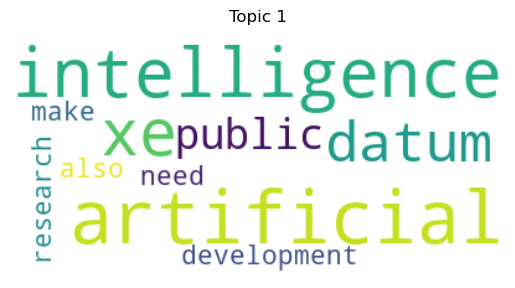

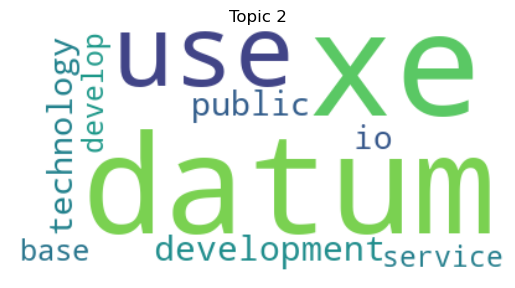

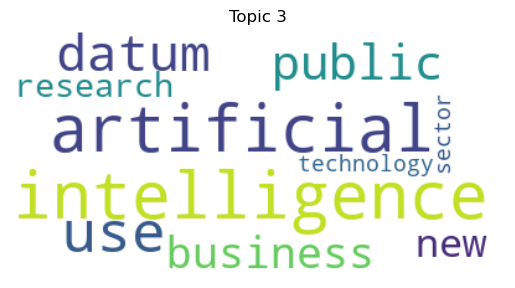

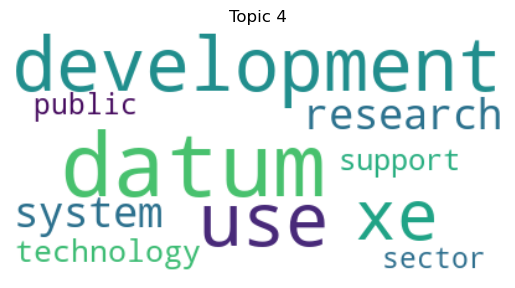

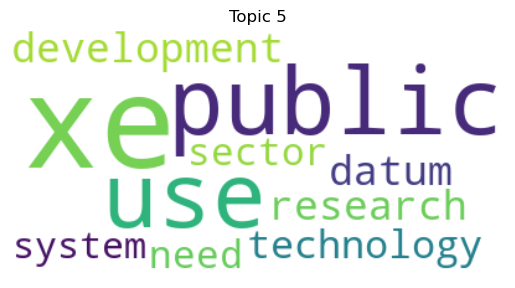

In [80]:
for i in range(1, 6):
    create_wordcloud(lda_model, topic=i)